Lab6 - Zmiana wartości pikseli – Metody na obrazie 
1. im.getpixel i im.putpixel 
2. im.load 
3. im.point 

In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# 1. Wczytaj pod nazwą obraz obrazek wybrany na poprzednich zajęciach. Przekształcenia wykonuj na kopii tego obrazu. Wczytaj obraz czarnobiały obraz z inicjałami (z lab1) pod nazwą inicjaly. 


In [2]:
obraz = Image.open('obraz.jpg')
inicjaly = Image.open('an.bmp')

obraz_copy = obraz.copy()

# 2. Korzystając z metod getpixel i putpixel:  

* a. Napisz funkcję wstaw_inicjaly(obraz, inicjaly, m, n, kolor), gdzie m, 
    n są współrzędnymi punktu, w którym wstawimy w obraz,  inicjaly 
    w kolorze równym wartości kolor.   Utwórz i zapisz obraz1, w 
    którym inicjały w kolorze czerwonym są wstawione tak, że prawy 
    dolny róg obrazu inicjaly  pokrywa się z prawym dolnym rogiem 
    obrazu.  

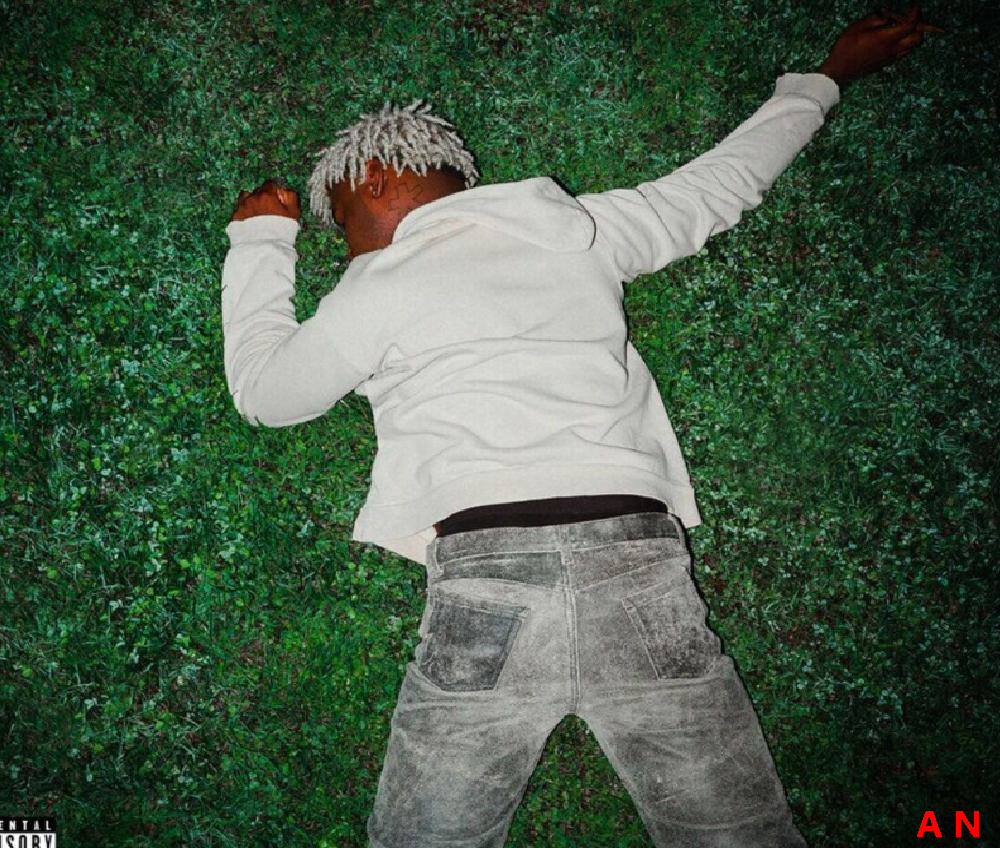

In [3]:

def wstaw_inicjaly(obraz, inicjaly, m, n, kolor):
    obraz_copy = obraz.copy()
    inicjaly_copy = inicjaly.convert('L')
    
    width, height = inicjaly.size

    for i in range(width):
        for j in range(height):
            pixel_inicjaly = inicjaly.getpixel((i, j))

            if pixel_inicjaly < 128:
                obraz_copy.putpixel((m + i, n + j), kolor)

    return obraz_copy

width_obraz, height_obraz = obraz.size
width_inicjaly, height_inicjaly = inicjaly.size

m = width_obraz - width_inicjaly
n = height_obraz - height_inicjaly

obraz1 = wstaw_inicjaly(obraz, inicjaly, m, n, (255, 0, 0))

obraz1.save('obraz1.jpg')
obraz1

* b. Analogicznie do funkcji rozjasnij_obraz_z_maska, napisz funkcję 
    wstaw_inicjaly_maska(obraz, inicjaly, m, n), gdzie m, n są 
    współrzędnymi punktu, w którym traktując  inicjały jako maskę  
    zmienimy piksele odpowiadające czarnym pikselom z maski na ich 
    negatywy. Utwórz i zapisz obraz2, w którym maska jest wstawiona 
    mniej więcej na środku obrazu.  

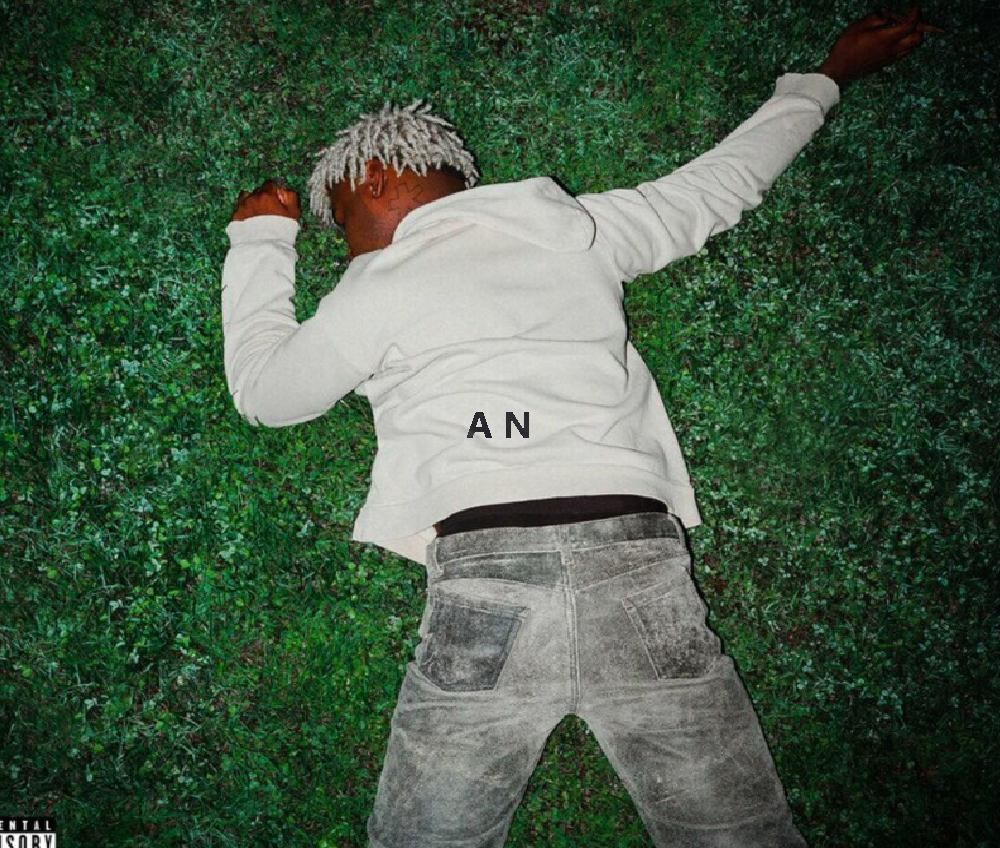

In [4]:
from PIL import Image

def wstaw_inicjaly_maska(obraz, inicjaly, m, n):
    obraz1 = obraz.copy()
    inicjaly_copy = inicjaly.convert('L')
    
    w, h = obraz.size
    w0, h0 = inicjaly_copy.size

    for i in range(w0):
        for j in range(h0):
            if inicjaly_copy.getpixel((i, j)) < 128:  
                if 0 <= i + m < w and 0 <= j + n < h:
                    p = obraz.getpixel((i + m, j + n))
                    negatyw = (255 - p[0], 255 - p[1], 255 - p[2])
                    obraz1.putpixel((i + m, j + n), negatyw)

    return obraz1

width_obraz, height_obraz = obraz.size
width_inicjaly, height_inicjaly = inicjaly.size

m = (width_obraz - width_inicjaly) // 2
n = (height_obraz - height_inicjaly) // 2

obraz2 = wstaw_inicjaly_maska(obraz, inicjaly, m, n)

obraz2.save('obraz2.jpg')
obraz2

# 3. Stosując metodę load napisz funkcje wstaw_inicjaly_load(obraz, inicjaly, m, n, kolor) oraz wstaw_inicjaly_maska(obraz, inicjaly, m, n, x, y, z) działające identycznie jak funkcje z pkt. 2.a, 2.b. Przetestuj je z tymi samymi ustawieniami co w zadaniu 2.  Wyniki testu przedstaw na diagramie plt ((pod nazwą fig1.png).   

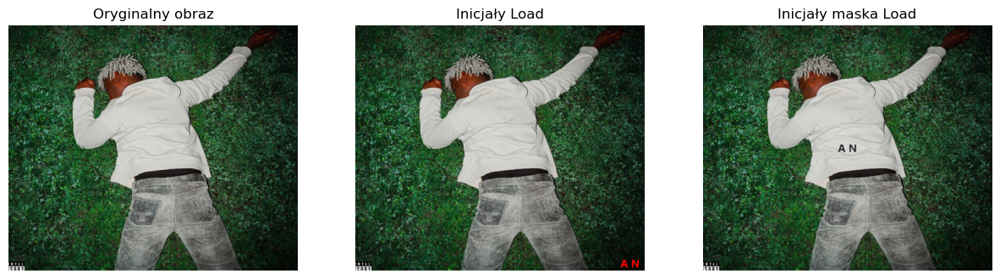

In [5]:
from PIL import Image
import matplotlib.pyplot as plt

def wstaw_inicjaly_load(obraz, inicjaly, m, n, kolor):
    obraz_copy = obraz.copy()
    inicjaly_copy = inicjaly.convert('L')
    
    pixels_obraz = obraz_copy.load()
    pixels_inicjaly = inicjaly_copy.load()

    width, height = inicjaly_copy.size

    for i in range(width):
        for j in range(height):
            if pixels_inicjaly[i, j] < 128:
                pixels_obraz[m + i, n + j] = kolor

    return obraz_copy


def wstaw_inicjaly_maska_load(obraz, inicjaly, m, n):
    obraz_copy = obraz.copy()
    inicjaly_copy = inicjaly.convert('L')
    
    pixels_obraz = obraz_copy.load()
    pixels_inicjaly = inicjaly_copy.load()

    width, height = inicjaly_copy.size

    for i in range(width):
        for j in range(height):
            if pixels_inicjaly[i, j] < 128:
                r, g, b = pixels_obraz[m + i, n + j]
                pixels_obraz[m + i, n + j] = (255 - r, 255 - g, 255 - b)

    return obraz_copy

width_obraz, height_obraz = obraz.size
width_inicjaly, height_inicjaly = inicjaly.size

m_a = width_obraz - width_inicjaly
n_a = height_obraz - height_inicjaly

obraz1_load = wstaw_inicjaly_load(obraz, inicjaly, m_a, n_a, (255, 0, 0))

m_b = (width_obraz - width_inicjaly) // 2
n_b = (height_obraz - height_inicjaly) // 2

obraz2_load = wstaw_inicjaly_maska_load(obraz, inicjaly, m_b, n_b)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(obraz)
axs[0].set_title('Oryginalny obraz')
axs[0].axis('off')

axs[1].imshow(obraz1_load)
axs[1].set_title('Inicjały Load')
axs[1].axis('off')

axs[2].imshow(obraz2_load)
axs[2].set_title('Inicjały maska Load')
axs[2].axis('off')

plt.savefig('fig1.png')
plt.show()

# 4. Stosując metodę point i funkcję lambda: 
* a. Napisz funkcję  
    kontrast(obraz, wsp_kontrastu), która działa tak, 
    że każdy piksel i zmienia wartość zgodnie z funkcją kontrastu  
    f(i) = 128 + (i -128) * mn,    gdzie  
    mn = (( 255 + wsp_kontrastu) /255) **2,  a wsp_kontrastu 
    przyjmuje wartości o 0 do 100 
    Przetestuj różne wartości wsp_kontrastu oraz  obraz oryginalny i 3 
    różne obrazy z testu umieść na diagramie plt (pod nazwą fig2.png).  
    Napisz w raporcie jak wartości wsp_kontrastu wpływają na 
    uzyskany efekt  

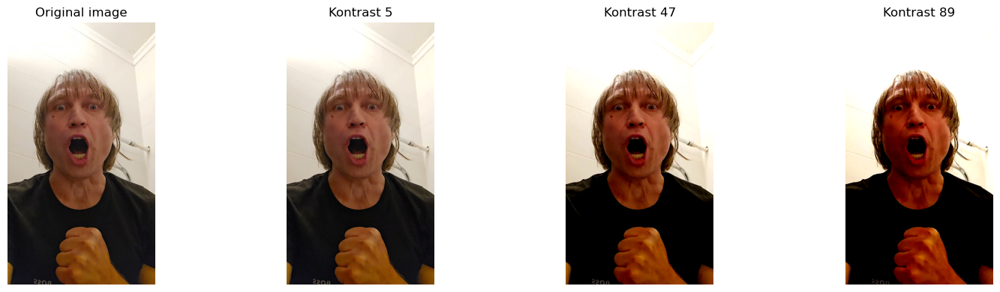

In [6]:
def kontrast(image, wsp_kontrastu):
    mn = ((255 + wsp_kontrastu) / 255) ** 2
    return image.point(lambda i: 128 + (i - 128) * mn)

original_image = Image.open("im_zad4.jpg")


image1 = kontrast(original_image, 5)
image2 = kontrast(original_image, 47)
image3 = kontrast(original_image, 89)

fig, ax = plt.subplots(1, 4, figsize=(16, 4))

ax[0].imshow(original_image)
ax[0].set_title("Original image")
ax[0].axis("off")

ax[1].imshow(image1)
ax[1].set_title("Kontrast 5")
ax[1].axis("off")

ax[2].imshow(image2)
ax[2].set_title("Kontrast 47")
ax[2].axis("off")

ax[3].imshow(image3)
ax[3].set_title("Kontrast 89")
ax[3].axis("off")

plt.tight_layout()
plt.savefig('fig2.png')
plt.show()

Wzrost wartości współczynnika wsp_kontrastu prowadzi do bardziej dramatycznych efektów wizualnych, ale przy wysokich wartościach istnieje ryzyko utraty szczegółów

* b. Napisz funkcję transformacja_logarytmiczna(obraz), która działa tak, że każdy piksel i zmienia wartość zgodnie z funkcją f(i) = 255 * np.log(1 + i / 255). Obraz oryginalny, obraz uzyskany po zastosowaniu tej funkcji i obraz po zastosowaniu funkcji filtru liniowego dla a=2 i b =100 umieść na diagramie plt (pod nazwą fig3.png).  Napisz w raporcie czym różnią się te 3 obrazy.  


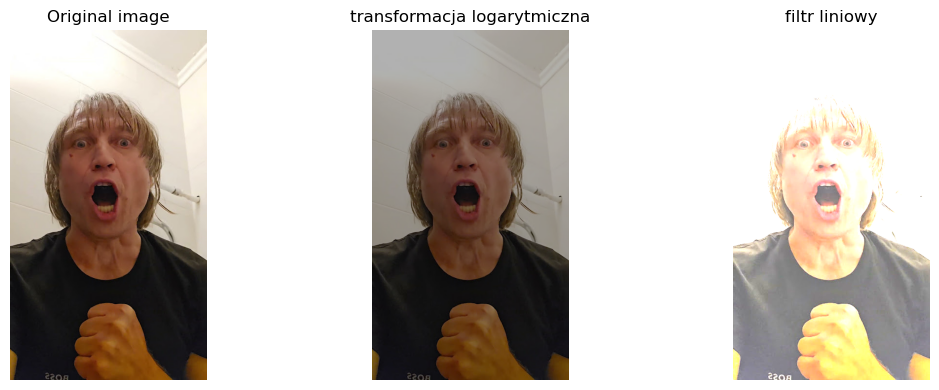

In [7]:
def transformacja_logarytmiczna(image):
    return image.point(lambda i: 255 * np.log(1 + i / 255))

def filtr_liniowy(image, a=2, b=100):
    return image.point(lambda i: a * i + b)

original_image = Image.open("im_zad4.jpg")

log_image = transformacja_logarytmiczna(original_image)
linear_image = filtr_liniowy(original_image, a=2, b=100)

fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(original_image)
ax[0].set_title("Original image")
ax[0].axis("off")

ax[1].imshow(log_image)
ax[1].set_title("transformacja logarytmiczna")
ax[1].axis("off")

ax[2].imshow(linear_image)
ax[2].set_title("filtr liniowy")
ax[2].axis("off")

plt.tight_layout()
plt.savefig('fig3.png')
plt.show()


Transformacja logarytmiczna lepiej zachowuje detale w ciemnych partiach obrazu, podczas gdy filtr liniowy drastycznie zmienia jasność całego obrazu, mogąc prowadzić do utraty subtelnych różnic tonalnych w jasnych regionach.

* c. Napisz funkcję transformacja_gamma (obraz, gamma), która działa 
    tak, że każdy piksel i zmienia wartość zgodnie z funkcją   
    f(i)  =  (i / 255) ** (1 / gamma) * 255), gdzie gamma jest 
    współczynnikiem większym od zera, ale może też być zarówno 
    ułamkiem jak i liczbą całkowitą w zakresie do 100. 
    Podobnie jak w 4a. przetestuj różne wartości gamma i  napisz w 
    raporcie jak wartości gamma wpływają na uzyskany efekt oraz 
    umieść na diagramie plt (pod nazwą fig4.png).  

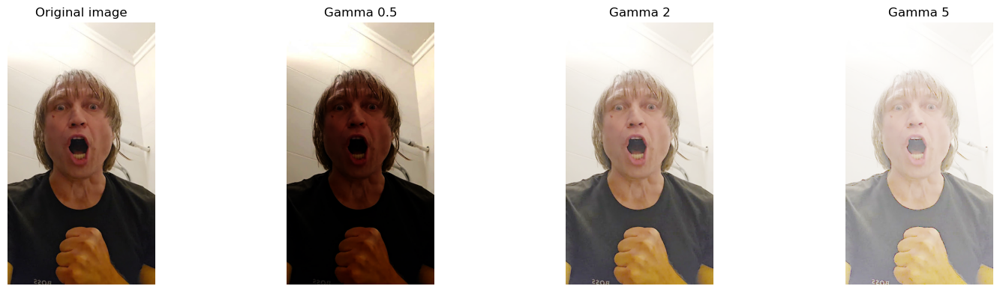

In [8]:
def transformacja_gamma(image, gamma):
    if gamma <= 0:
        raise ValueError("Gamma must be greater than zero.")
    return image.point(lambda i: int(((i / 255) ** (1 / gamma)) * 255))

original_image = Image.open("im_zad4.jpg")

image1 = transformacja_gamma(original_image, 0.5)
image2 = transformacja_gamma(original_image, 2)
image3 = transformacja_gamma(original_image, 5)

fig, ax = plt.subplots(1, 4, figsize=(16, 4))

ax[0].imshow(original_image)
ax[0].set_title("Original image")
ax[0].axis("off")

ax[1].imshow(image1)
ax[1].set_title("Gamma 0.5")
ax[1].axis("off")

ax[2].imshow(image2)
ax[2].set_title("Gamma 2")
ax[2].axis("off")

ax[3].imshow(image3)
ax[3].set_title("Gamma 5")
ax[3].axis("off")

plt.tight_layout()
plt.savefig('fig4.png')
plt.show()


Parametr Gamma odpowiada za jasność obrazu. Możemy obserwować zmianę jasności obrazu w zależności od ustalonego parametru. Oryginalny obraz ma wartość 1. Im niże, tym ciemniej, im więcej znaczenie parametru, tym większa go jasność.

# 5. Napisz,  
* a. dlaczego obraz powstały z zastosowania poleceń  
    T = np.array(obraz, dtype='uint8') 
    T += 100 
    obraz_wynik = Image.fromarray(T, "RGB")  
    jest inny niż obraz powstały z zastosowania funkcji  
    obraz.point(lambda i: i + 100) 

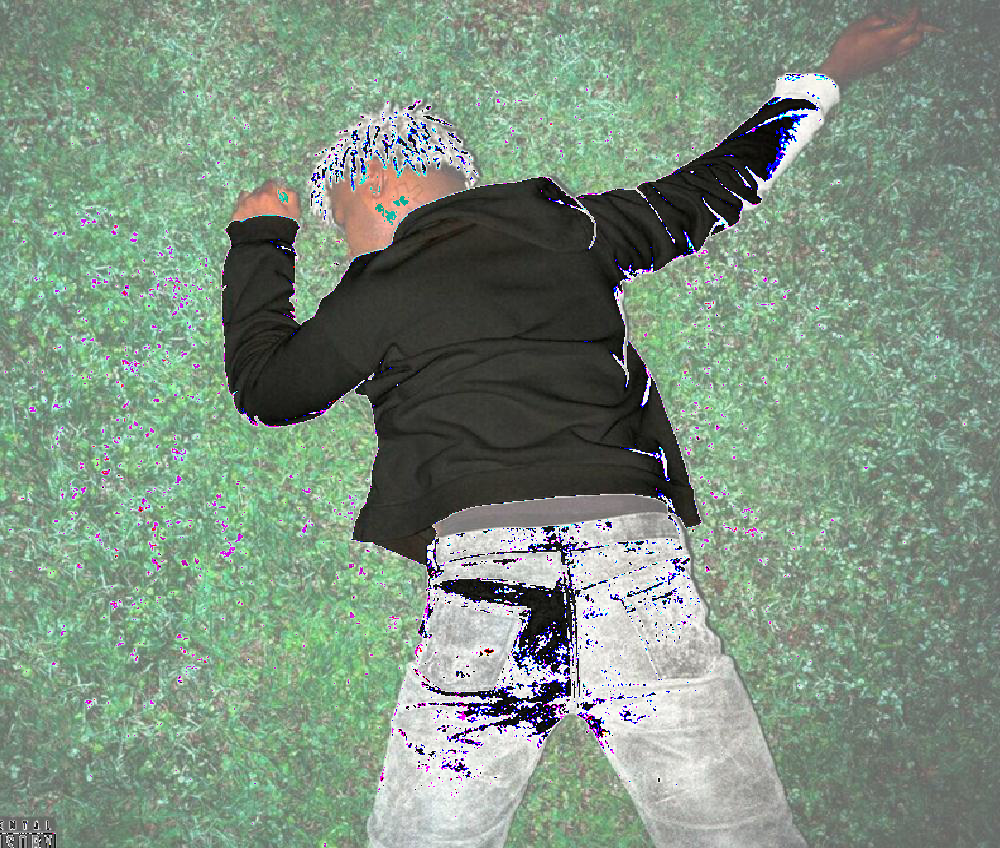

In [9]:
T = np.array(obraz, dtype='uint8')
T += 100
obraz_wynik = Image.fromarray(T, "RGB")
obraz_wynik

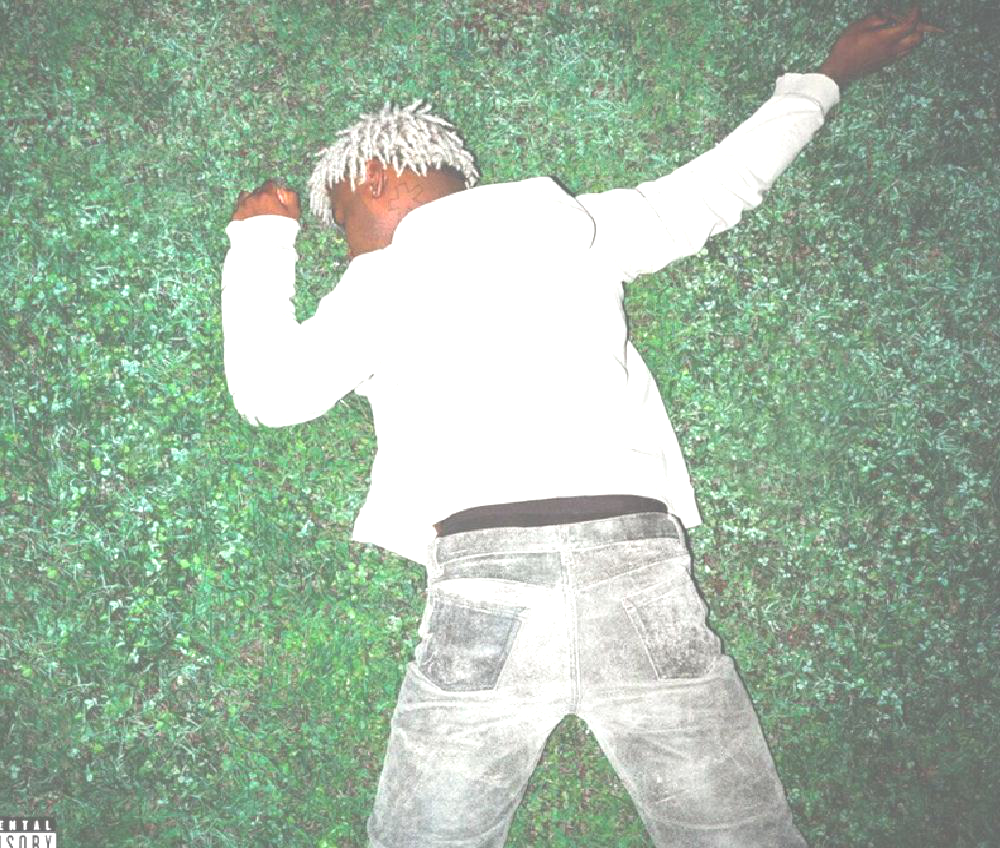

In [10]:
obraz.point(lambda i: i + 100)

Pierwsza operacja modyfikuje wartości tablicy NumPy, które są ograniczone typem uint8. Gdy wartość pikseli przekroczy 255, następuje przepływ modulo, w efekcie jasne piksele stają się ciemne.
Druga operacja zapewnia przetwarzanie każdego piksela indywidualnie, gdy wartość większa niż 25 funkcja przypisuje pikselu maksymalną wartość 255.

* b. Napisz funkcję, która działa na tablicy obrazu i daje taki sam efekt, 
    co obraz.point(lambda i: i + 100)

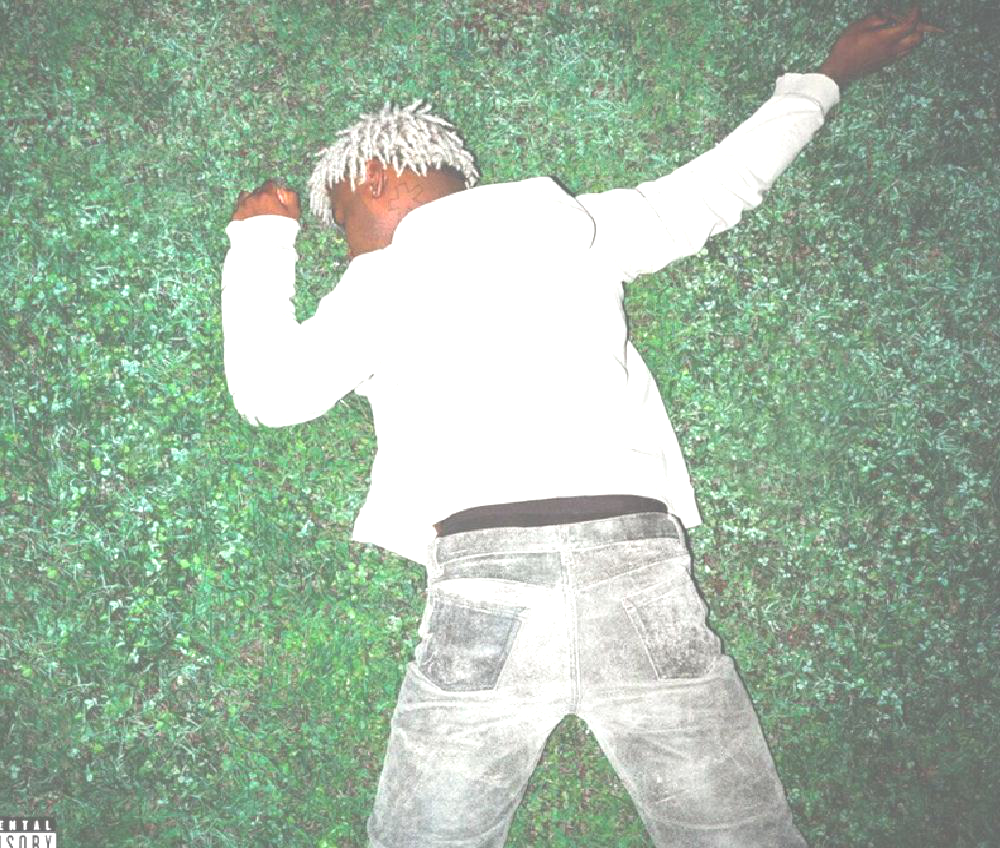

In [11]:
def dodaj_100_tablica_petla(tablica, value):
    if len(tablica.shape) == 3:  
        for y in range(tablica.shape[0]):  
            for x in range(tablica.shape[1]): 
                for k in range(tablica.shape[2]): 
                    tablica[y, x, k] = min(tablica[y, x, k] + value, 255)
                    
    elif len(tablica.shape) == 2: 
        for y in range(tablica.shape[0]): 
            for x in range(tablica.shape[1]):
                tablica[y, x] = min(tablica[y, x] + value, 255)
    else:
        raise ValueError("Nieobsługiwany format tablicy obrazu")

    return tablica



image_array = np.array(obraz, dtype="uint8")

modified_array = dodaj_100_tablica_petla(image_array, 100)

modified_image = Image.fromarray(modified_array, "RGB")

modified_image